# Endoscopy - kvasir-capsule SMOTE investigation

In [24]:
# import all libraries
import pandas as pd
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn import preprocessing

from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler

import tensorflow as tf
import keras.backend as K
from keras.utils import to_categorical

from keras.models import Model, Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from keras.layers import BatchNormalization
from keras.regularizers import l1_l2

from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import plot_confusion_matrix as pcm

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import cv2
import PIL
import os

In [3]:
img_folder = r'C:\Users\user\ML\endoscopy\kvasir-capsule'
# classes = os.listdir(img_folder)
# print(classes)

SIZE = 229

num_images_per_class = []
class_name = []

empty_images = []
empty_index = []

# if the dir has a metadata.csv file
if os.path.isfile(img_folder+'/metadata.csv'):
    meta = pd.read_csv(img_folder+'/metadata.csv', sep=';')
    df = meta[['filename', 'finding_class']]
    df.columns = ['filename', 'label']

else:
    # otherwise read through the sub-directories
    df = pd.DataFrame(columns=['filename', 'label'])
    for f in os.listdir(img_folder):
        for i in os.listdir(img_folder+'\\'+f):
            df = pd.concat([df, pd.DataFrame({'filename': i, 'label': f}, index=[0])], ignore_index=True)

class_name = list(set(list(df['label'])))
for cn in class_name:
    count = 0
    for i in range(len(df)):
        if df.loc[i, 'label'] == cn:
            count += 1
    num_images_per_class.append(count)
    print(cn, count)

Foreign Body 776
Reduced Mucosal View 2906
Erosion 507
Ampulla of Vater 10
Normal clean mucosa 34338
Blood - hematin 12
Ulcer 854
Pylorus 1538
Polyp 55
Ileocecal valve 4189
Angiectasia 866
Lymphangiectasia 592
Erythema 159
Blood - fresh 446


In [34]:
# undersample
n = 4189

resampled = pd.DataFrame(columns=df.columns)

lbls = list(set(list(df['label'])))
for i, x in enumerate(lbls):
    df_x = df[df['label'] == x]
    if len(df_x) > n:
        df_x = df_x[0:n]
        
    resampled = pd.concat([resampled, df_x], ignore_index=True)

resampled['label'].value_counts()

Normal clean mucosa     4189
Ileocecal valve         4189
Reduced Mucosal View    2906
Pylorus                 1538
Angiectasia              866
Ulcer                    854
Foreign Body             776
Lymphangiectasia         592
Erosion                  507
Blood - fresh            446
Erythema                 159
Polyp                     55
Blood - hematin           12
Ampulla of Vater          10
Name: label, dtype: int64

In [36]:
Xs = list(resampled['filename'])
ys = list(resampled['label'])

X_train, X_test, y_train, y_test = train_test_split(Xs, ys, test_size=0.25, random_state=0, stratify=ys)

print(len(X_train), len(y_train), len(X_test), len(y_test))

12824 12824 4275 4275


In [37]:
def make_count_dict(a):

    dct = {}
    for i, x in enumerate(a):
        if x not in dct.keys():
            dct[x] = 1
        else:
            dct[x] += 1

    return dct

y_train_dict = make_count_dict(y_train)
y_train_dict

{'Normal clean mucosa': 3142,
 'Ileocecal valve': 3142,
 'Ulcer': 641,
 'Reduced Mucosal View': 2179,
 'Blood - fresh': 335,
 'Erosion': 380,
 'Foreign Body': 582,
 'Pylorus': 1153,
 'Angiectasia': 649,
 'Lymphangiectasia': 444,
 'Polyp': 41,
 'Erythema': 119,
 'Ampulla of Vater': 8,
 'Blood - hematin': 9}

In [47]:
y_test_dict = make_count_dict(y_test)
y_test_dict

{'Ileocecal valve': 1047,
 'Foreign Body': 194,
 'Pylorus': 385,
 'Normal clean mucosa': 1047,
 'Reduced Mucosal View': 727,
 'Erosion': 127,
 'Angiectasia': 217,
 'Ulcer': 213,
 'Blood - fresh': 111,
 'Lymphangiectasia': 148,
 'Polyp': 14,
 'Erythema': 40,
 'Blood - hematin': 3,
 'Ampulla of Vater': 2}

In [39]:
SIZE = 229

train_images = []
train_labels = []

for i, img in enumerate(X_train):

    img_path = img_folder+'\\'+y_train[i]+'\\'+img
    #print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
    img = cv2.resize(img, (SIZE, SIZE))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    r_img = np.reshape(img, (SIZE*SIZE*3))
    train_images.append(r_img)
    train_labels.append(y_train[i])

train_images = np.array(train_images)
train_labels = np.array(train_labels)
    
train_images.shape

(12824, 157323)

In [40]:
test_images = []
test_labels = [] 

for i, img in enumerate(X_test):

    img_path = img_folder+'\\'+y_test[i]+'\\'+img
    #print(img_path)

    img = cv2.imread(img_path, cv2.IMREAD_COLOR)       
    img = cv2.resize(img, (SIZE, SIZE))
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)

    r_img = np.reshape(img, (SIZE*SIZE*3))
    test_images.append(r_img)
    test_labels.append(y_test[i])

test_images = np.array(test_images)
test_labels = np.array(test_labels)

test_images.shape

(4275, 157323)

In [49]:
from imblearn.over_sampling import SMOTE
sm = SMOTE(random_state=42)

X_train_smote, y_train_smote = sm.fit_resample(train_images, train_labels)

In [50]:
y_train_smote_dict = make_count_dict(y_train_smote)
y_train_smote_dict

{'Normal clean mucosa': 3142,
 'Ileocecal valve': 3142,
 'Ulcer': 3142,
 'Reduced Mucosal View': 3142,
 'Blood - fresh': 3142,
 'Erosion': 3142,
 'Foreign Body': 3142,
 'Pylorus': 3142,
 'Angiectasia': 3142,
 'Lymphangiectasia': 3142,
 'Polyp': 3142,
 'Erythema': 3142,
 'Ampulla of Vater': 3142,
 'Blood - hematin': 3142}

In [51]:
len(X_train_smote)

43988

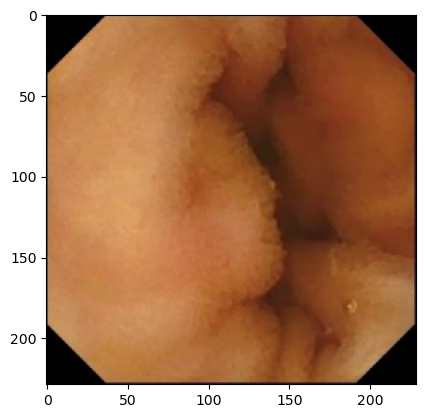

In [52]:
X_train_smote_images = []
for i, x in enumerate(X_train_smote):
    img = np.reshape(x, (SIZE, SIZE, 3))
    X_train_smote_images.append(img)

plt.imshow(X_train_smote_images[0])

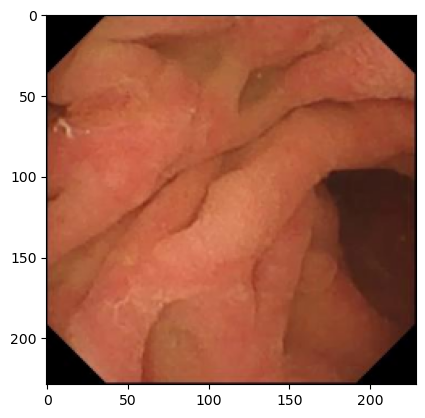

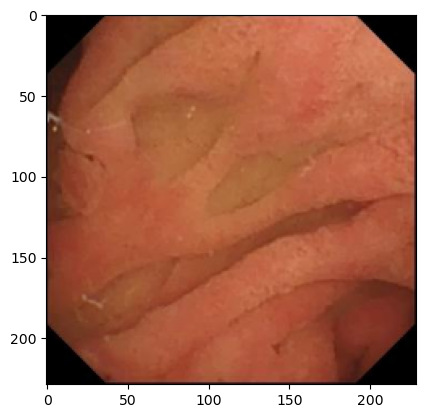

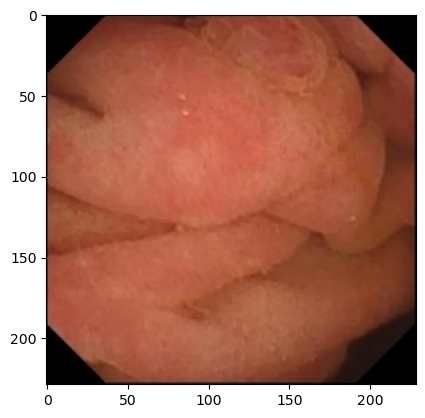

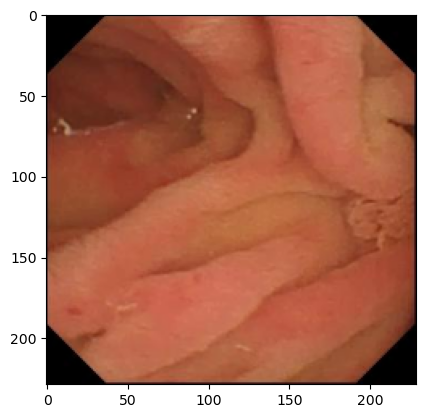

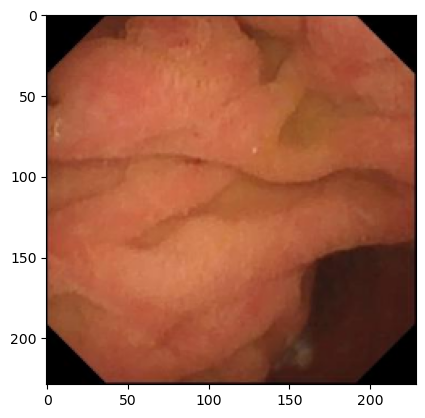

...

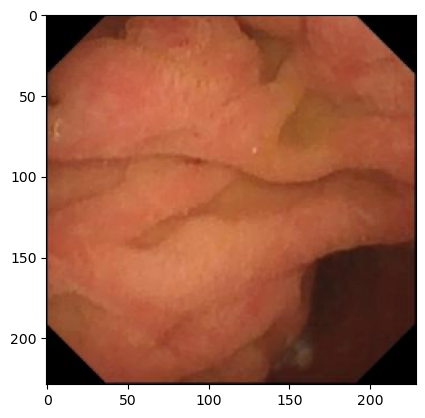

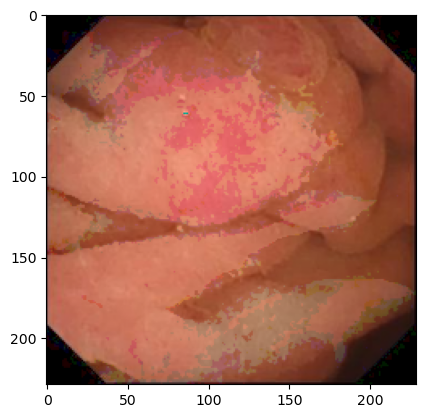

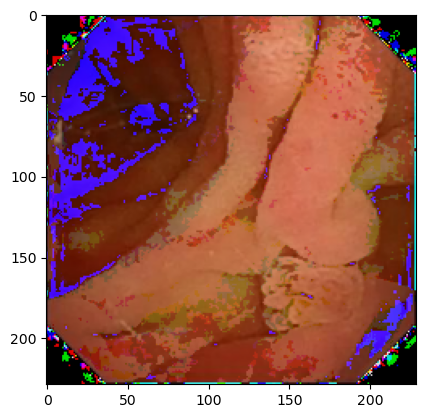

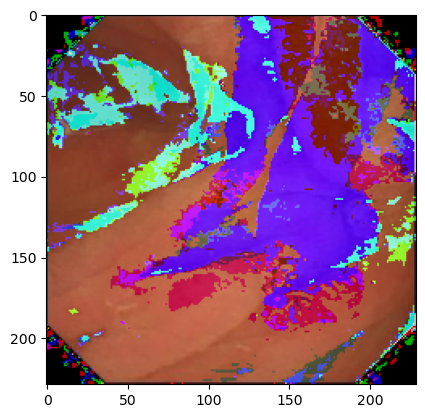

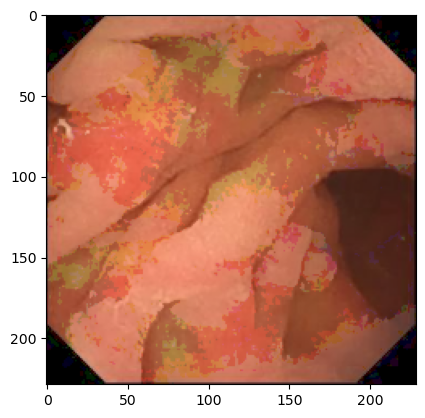

In [61]:
count = 0
for i, x in enumerate(y_train_smote):
    if x == "Ampulla of Vater":
        count += 1

        plt.imshow(X_train_smote_images[i])

        plt.imsave(img_folder+'/Ampulla of vater/smote_'+str(i)+'.jpg', X_train_smote_images[i])

        plt.show()
        
        if count > 50:
            break